In [1]:
import os
import mne
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import scipy.stats as stats
import numpy as np
import pandas as pd
import pickle
from utils import *

In [2]:
if os.path.exists('../Data/results/cpp_stim.pickle') and os.path.exists('../Data/results/cpp_cue.pickle') and os.path.exists('../Data/results/cpp_resp.pickle'):
    with open('../Data/results/cpp_stim.pickle', 'rb') as f:
        cpp_stim = pickle.load(f)
    with open('../Data/results/cpp_cue.pickle', 'rb') as f:
        cpp_cue = pickle.load(f)
    with open('../Data/results/cpp_resp.pickle', 'rb') as f:
        cpp_resp = pickle.load(f)
    rawdata = pd.read_csv('../Data/results/beh_preprocessed.csv',sep='\t')
else:
    # Load eeg data
    folder_path = '../Data/preprocessed_data'
    file_list = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.fif')]
    raw_data_list = []
    for file_path in file_list:
        raw_data = mne.io.read_raw_fif(file_path)
        raw_data_list.append(raw_data) # raw_data_list is a list of raw data
    # Load behavioral data
    rawdata = pd.read_csv('../Data/results/beh_preprocessed.csv',sep='\t')
    # Get cpp ERP data of all subjects according to different locked time points
    cpp_stim = ERP_pop(raw_data_list, 'stim', tmin=-1.5, tmax=1.5, baseline = (-1.5,-1))
    cpp_cue = ERP_pop(raw_data_list, 'cue', tmin=-0.5, tmax=3, baseline = (-0.5,0))
    cpp_resp = ERP_pop(raw_data_list, 'resp', tmin=-2, tmax=1, baseline = (None,0))
    # Save the data
    with open('../Data/results/cpp_stim.pickle', 'wb') as f:
        pickle.dump(cpp_stim, f)
    with open('../Data/results/cpp_cue.pickle', 'wb') as f:
        pickle.dump(cpp_cue, f)
    with open('../Data/results/cpp_resp.pickle', 'wb') as f:
        pickle.dump(cpp_resp, f)

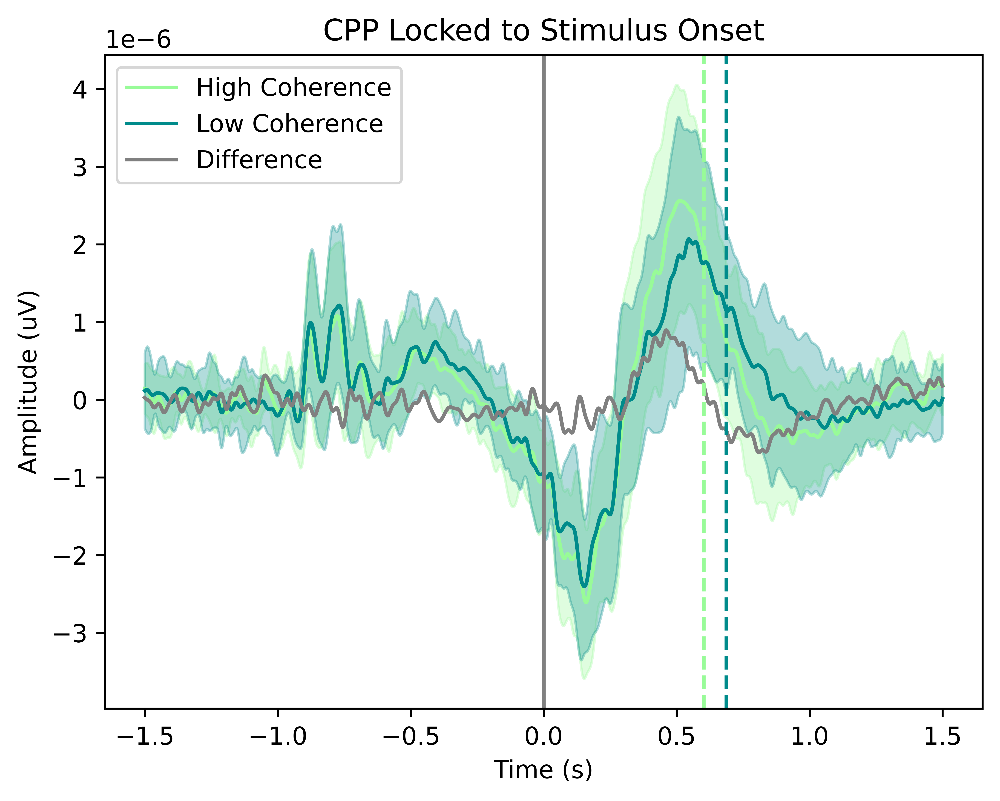

In [5]:
# transform points to time 
x = np.arange(len(cpp_stim[0]))/512-1.5
# get mean and std of each condition
mean1 = cpp_stim[0]
std1 = cpp_stim[1]
mean2 = cpp_stim[2]
std2 = cpp_stim[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
# plot mean ERP of each condition and their difference
plt.plot(x, 
         mean1, 
         label='High Coherence',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Low Coherence',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot vertical lines to indicate the time point of peak amplitude
rt_hc = rawdata.loc[rawdata['coherence']=='high','rt'].mean()+0.2
rt_lc = rawdata.loc[rawdata['coherence']=='low','rt'].mean()+0.2
plt.axvline(x=rt_hc, 
            color='PaleGreen', 
            #alpha=0.5,
            linestyle='--')
plt.axvline(x=rt_lc, 
            color='DarkCyan', 
            #alpha=0.5,
            linestyle='--')
# plot horizontal and vertical lines to indicate the time point of stimulus onset
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Stimulus Onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
#plt.savefig('figures/erp_cpp_stim.png',dpi=1000)
plt.show()

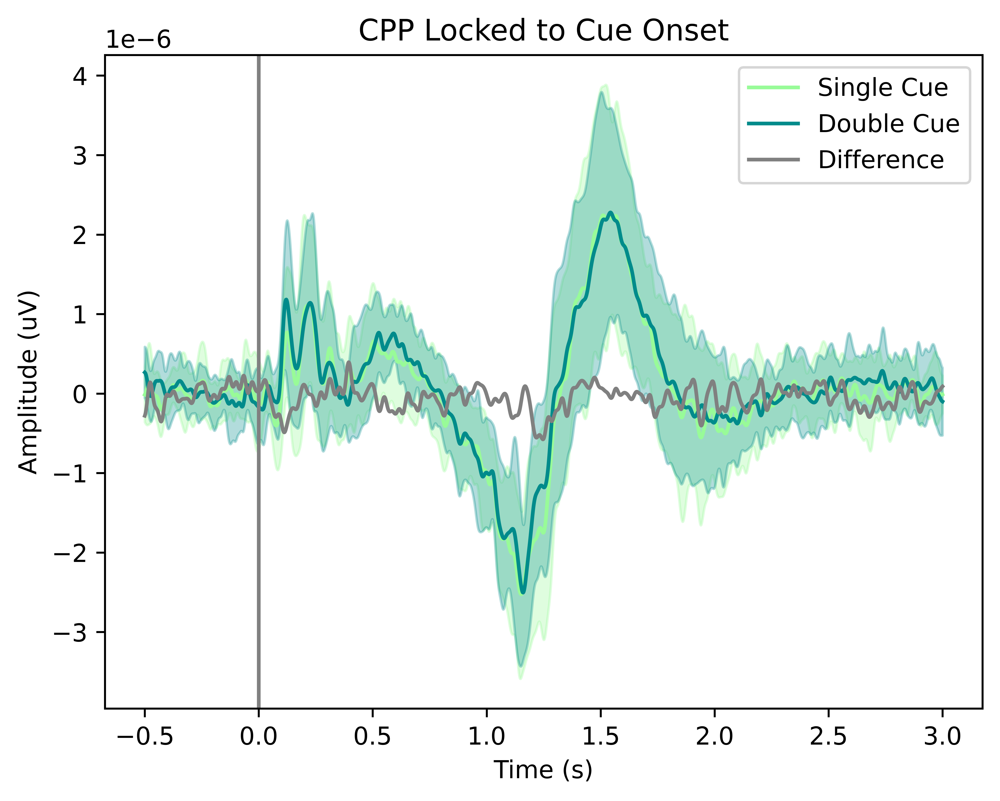

In [6]:
# transform points to time
x = np.arange(len(cpp_cue[0]))/512-0.5
# get mean and std of each condition
mean1 = cpp_cue[0]
std1 = cpp_cue[1]
mean2 = cpp_cue[2]
std2 = cpp_cue[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
plt.plot(x, 
         mean1, 
         label='Single Cue',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Double Cue',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of cue onset
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Cue Onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
#plt.savefig('figures/erp_cpp_cue.png',dpi=1000)
plt.show()

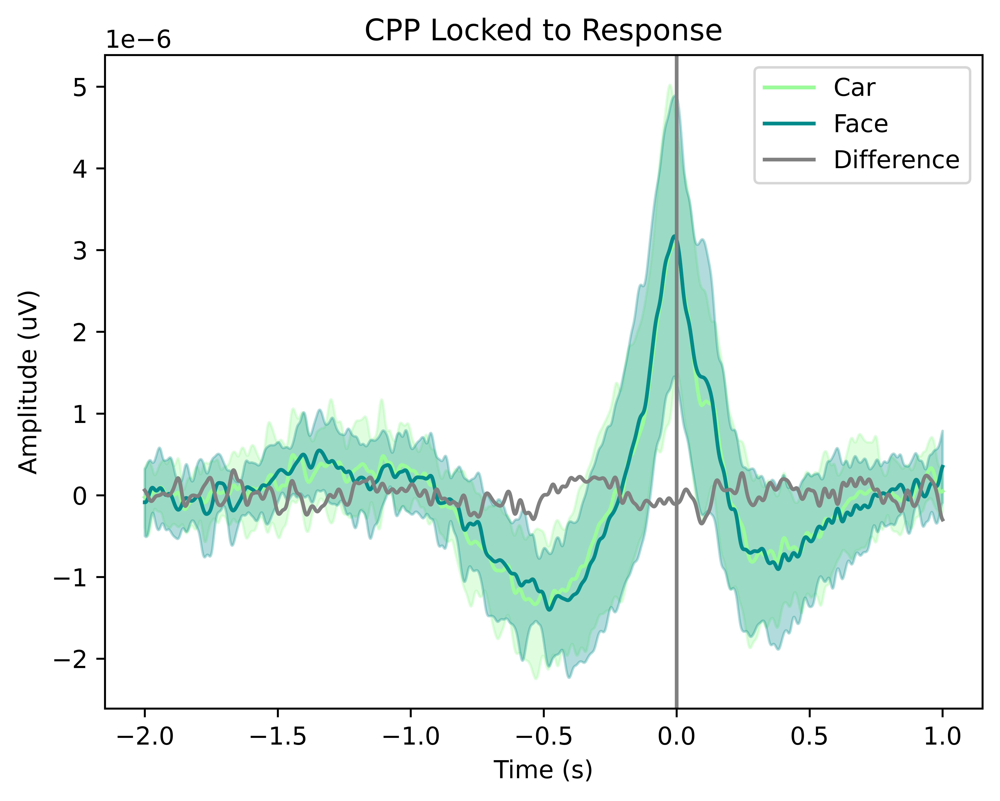

In [7]:
# transform points to time 
x = np.arange(len(cpp_resp[0]))/512-2
# get mean and std of each condition
mean1 = cpp_resp[0]
std1 = cpp_resp[1]
mean2 = cpp_resp[2]
std2 = cpp_resp[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
# plot mean ERP of each condition and their difference
plt.plot(x, 
         mean1, 
         label='Car',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Face',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
#plt.savefig('figures/erp_cpp_resp.png',dpi=1000)
plt.show()

In [2]:
# get epoch data
if os.path.exists('../Data/results/dfs_resp.csv') and os.path.exists('../Data/results/dfs_stim.csv') and os.path.exists('../Data/results/dfs_resp_sm.csv') and os.path.exists('../Data/results/dfs_resp_fc.csv'):
    dfs_resp = pd.read_csv('../Data/results/dfs_resp.csv')
    dfs_stim = pd.read_csv('../Data/results/dfs_stim.csv')
    dfs_resp_sm = pd.read_csv('../Data/results/dfs_resp_sm.csv')
    # rename the column
    dfs_resp.rename(columns={col:int(col) for col in dfs_resp.columns if col.isdigit()} ,inplace=True)
    dfs_stim.rename(columns={col:int(col) for col in dfs_stim.columns if col.isdigit()} ,inplace=True)
    dfs_resp_sm.rename(columns={col:int(col) for col in dfs_resp_sm.columns if col.isdigit()} ,inplace=True)
else:        
    # Load eeg data
    folder_path = '../Data/preprocessed_data'
    file_list = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.fif')]
    raw_data_list = []
    for file_path in file_list:
        raw_data = mne.io.read_raw_fif(file_path)
        raw_data_list.append(raw_data) # raw_data_list is a list of raw data
    # Load behavioral data
    rawdata = pd.read_csv('../Data/results/beh_preprocessed.csv',sep='\t')
    dfs_resp = epoch2df(raw_data_list,rawdata=rawdata, tmin=-3, tmax=1, baseline = (None,0), locked='resp')
    dfs_stim = epoch2df(raw_data_list,rawdata=rawdata,tmin=-1.5, tmax=1.5, baseline = (-1.5,-1),locked='stim')
    dfs_resp_sm = smooth(dfs_resp)
    
    dfs_resp_fc = add_feature(dfs_resp,dfs_resp_sm)
    dfs_resp_fc.drop(columns=np.arange(0,2049),inplace=True)
    

    dfs_resp.to_csv('../Data/results/dfs_resp.csv',index=False)
    dfs_stim.to_csv('../Data/results/dfs_stim.csv',index=False)
    dfs_resp_sm.to_csv('../Data/results/dfs_resp_sm.csv',index=False)
    dfs_resp_fc.to_csv('../Data/results/dfs_resp_fc.csv',index=False)


In [31]:
def sigtest(cond1,cond2,feature):
    '''
    This function is used to test the significance of the difference between two conditions
    the time window is 0.1s and the slide window is 0.01s
    ----------
    params:
        cond1: dataframe of condition 1
        cond2: dataframe of condition 2
        feature: feature to be tested
    ----------
    return:
        ts: time points of significant difference
    '''
    import scipy.stats as stats
    # initialize dataframe
    ts = []
    # transform time window to time points
    #tw = 0.1
    #tp = round((0.1*512)/2)
    # transform slide window to time points
    #sw = 0.01
    #sp = round(0.01*512)
    #sp = 1
    # loop through each slide window
    for i in range(cond1.shape[1]):
        if feature == 'amplitude':
            cond1_win = cond1.loc[:,i]
            cond2_win = cond2.loc[:,i]
        # t-test
        _,p = stats.ttest_rel(cond1_win,cond2_win)
        # store the time points of significant difference
        if p < 0.05:
            ts.append(i)
    return ts


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\4142984897.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond1 = dfs_resp.loc[dfs_resp['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\4142984897.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond2 = dfs_resp.loc[dfs_resp['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]


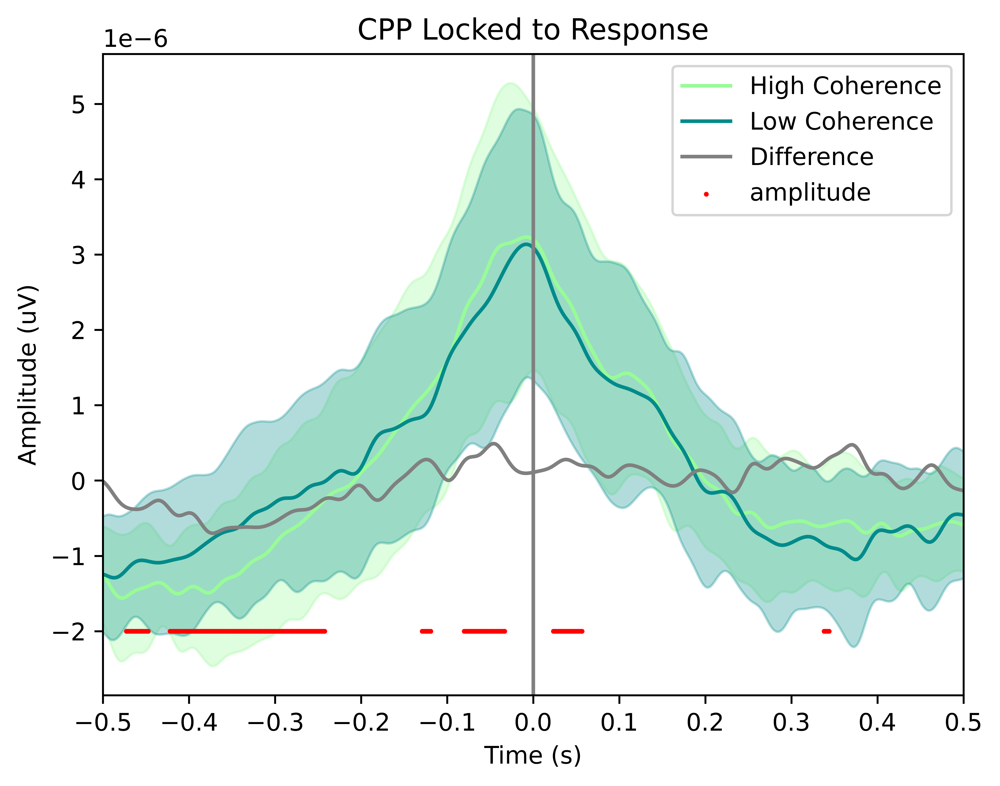

In [32]:
# transform points to time 
x =np.arange(dfs_resp.loc[:,0:].shape[1])/512-3 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_resp.loc[dfs_resp['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
cond2 = dfs_resp.loc[dfs_resp['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(dpi=1000)
# plot the mean of each condition
plt.plot(x,mean1,color='PaleGreen',label='High Coherence')
plt.plot(x,mean2,color='DarkCyan',label='Low Coherence')
plt.plot(x,mean1-mean2,label='Difference',color='grey')
# plot the std of each condition
plt.fill_between(x,mean1 -std1,mean1 +std1,alpha=0.3,color = 'PaleGreen')
plt.fill_between(x,mean2 -std2,mean2 +std2,alpha=0.3,color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
plt.axvline(x=0, color='grey', linestyle='-')
# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 2e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-3,y=y_amp,color='red', s=1, label='amplitude')
plt.title('CPP Locked to Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(-0.5,0.5)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png',dpi=1000)
plt.show()

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\852767155.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond1 = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\852767155.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond2 = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\852767155.py:39: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a futu

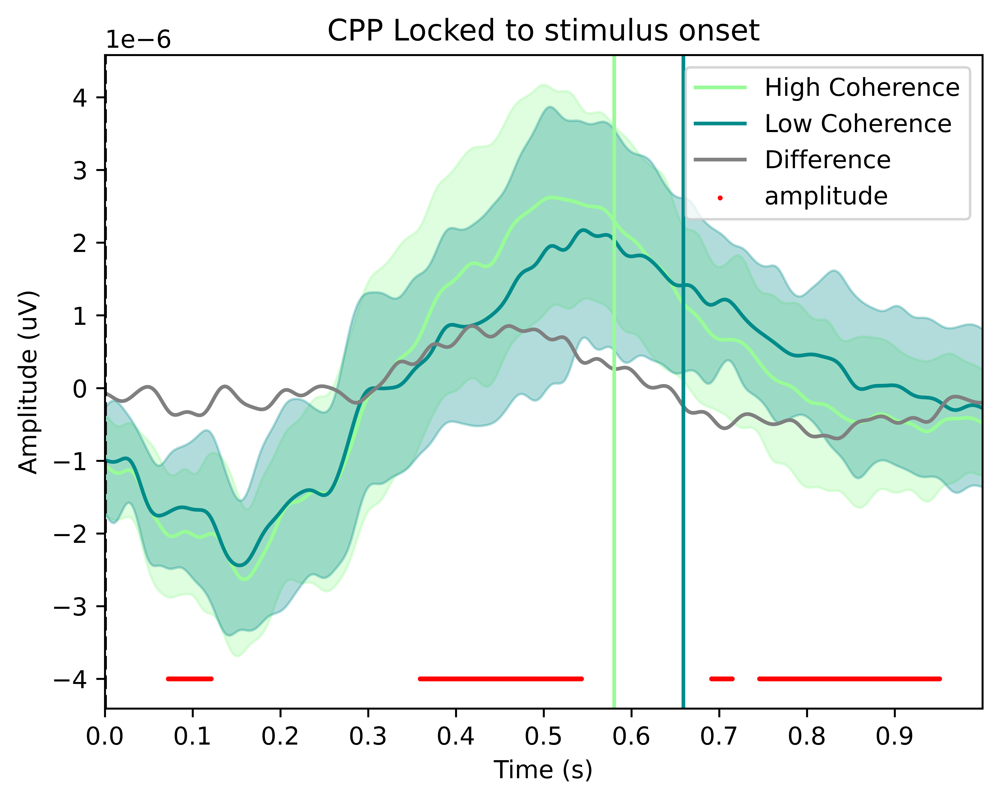

In [33]:
# transform points to time 
x =np.arange(dfs_stim.loc[:,0:].shape[1])/512-1.5 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
cond2 = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(#figsize=(10,5),
             dpi=1000)
# plot the mean of each condition
plt.plot(x,
         mean1,
         color='PaleGreen',
         label='High Coherence')
plt.plot(x,
         mean2,
         color='DarkCyan',
         label='Low Coherence')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot the std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
rt_hc = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
rt_lc = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
plt.axvline(x=0, color='black', linestyle='--')
plt.axvline(x=rt_hc.mean(), color='PaleGreen', linestyle='-')
plt.axvline(x=rt_lc.mean(), color='DarkCyan', linestyle='-')

# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
#ts_slp = np.array(sigtest(cond1,cond2,'slope'))
#ts_pk = np.array(sigtest(cond1,cond2,'peak'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 4e-6
#y_slp = np.array(ts_slp) * 0 - 3.8e-6
#y_pk = np.array(ts_pk) * 0 - 1.6e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-1.5,
            y=y_amp,
            color='red', 
            s=1, 
            label='amplitude')
#plt.scatter(x=ts_pk/512-3,
#            y=y_pk,
#            color='gray', 
#            s=1, 
#            label='peak')
# set title and labels
plt.title('CPP Locked to stimulus onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(0,1)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png', dpi=1000)
plt.show()

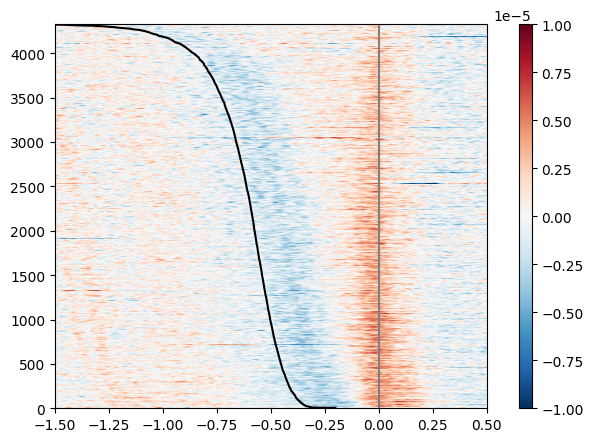

In [7]:
df_rm = dfs_resp.sort_values(by=['rt'],ascending=True)
plt.imshow(df_rm.loc[:,0:],
           origin='lower',
           cmap='RdBu_r',
           vmin=-1e-5,
           vmax=1e-5,
           aspect='auto',
           extent=[-3,1,0,len(df_rm)])
plt.plot(-df_rm['rt']-0.2,range(len(df_rm)),color = 'black')
plt.axvline(x=0, color='grey', linestyle='-')
plt.xlim(-1.5,0.5)
# set title and labels
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.02, 0.8])
plt.colorbar(cax=cax)

plt.show()

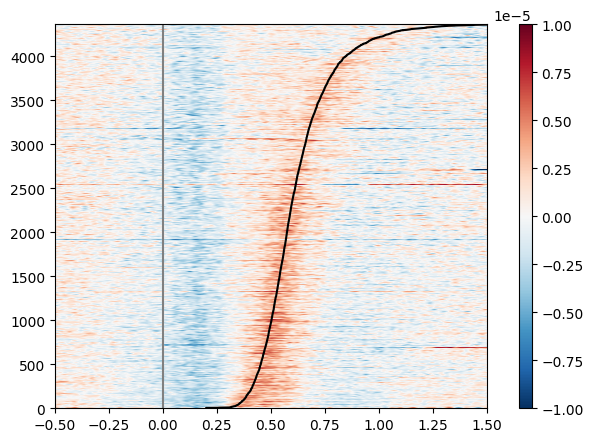

In [8]:
df_rm = dfs_stim.sort_values(by=['rt'],ascending=True)
plt.imshow(df_rm.loc[:,0:],
           origin='lower',
           cmap='RdBu_r',
           vmin=-1e-5,
           vmax=1e-5,
           aspect='auto',
           extent=[-1.5,1.5,0,len(df_rm)])
plt.plot(df_rm['rt']+0.2,range(len(df_rm)),color = 'black')
plt.axvline(x=0, color='grey', linestyle='-')
plt.xlim(-0.5,1.5)
# set title and labels
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.02, 0.8])
plt.colorbar(cax=cax)

plt.show()


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\1848996279.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond1 = dfs_resp.loc[dfs_resp['correct']==1].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\1848996279.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond2 = dfs_resp.loc[dfs_resp['correct']==0].groupby('subj_idx').mean().reset_index().loc[:,0:2048]


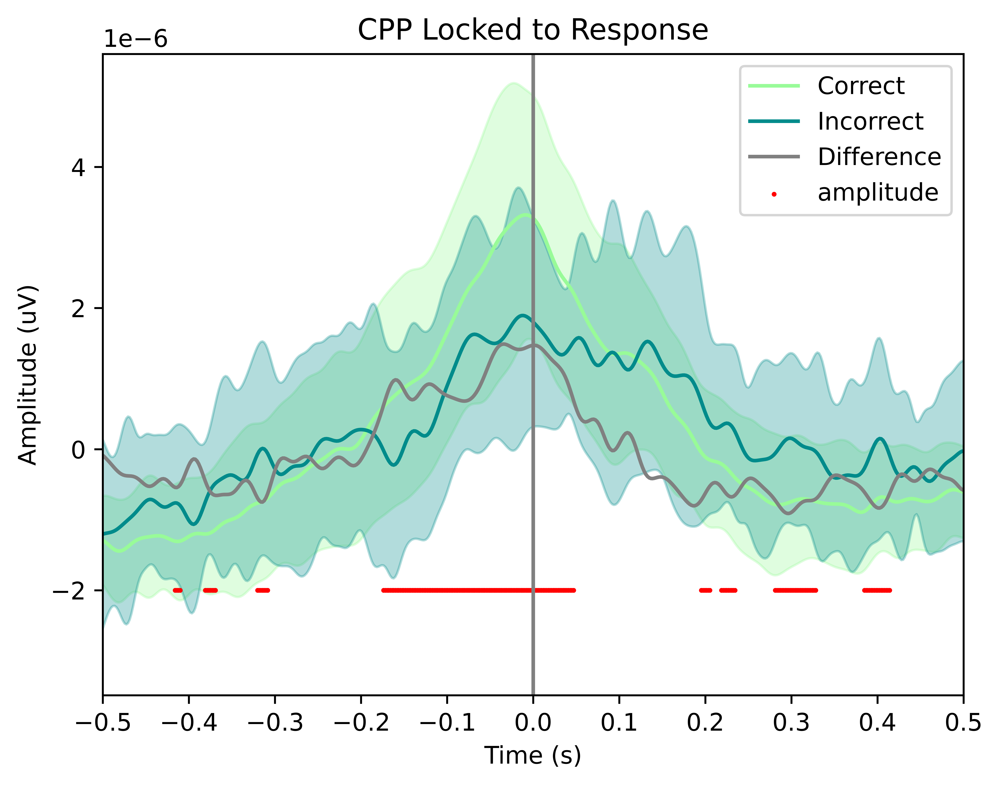

In [36]:
# transform points to time 
x =np.arange(dfs_resp.loc[:,0:].shape[1])/512-3 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_resp.loc[dfs_resp['correct']==1].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
cond2 = dfs_resp.loc[dfs_resp['correct']==0].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(dpi=1000)
# plot the mean of each condition
plt.plot(x,mean1,color='PaleGreen',label='Correct')
plt.plot(x,mean2,color='DarkCyan',label='Incorrect')
plt.plot(x,mean1-mean2,label='Difference',color='grey')
# plot the std of each condition
plt.fill_between(x,mean1 -std1,mean1 +std1,alpha=0.3,color = 'PaleGreen')
plt.fill_between(x,mean2 -std2,mean2 +std2,alpha=0.3,color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
plt.axvline(x=0, color='grey', linestyle='-')
# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 2e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-3,y=y_amp,color='red', s=1, label='amplitude')
plt.title('CPP Locked to Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(-0.5,0.5)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png',dpi=1000)
plt.show()

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\1308647787.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond1 = dfs_stim.loc[dfs_stim['correct']==1].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\1308647787.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cond2 = dfs_stim.loc[dfs_stim['correct']==0].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
C:\Users\liuyikang\AppData\Local\Temp\ipykernel_20968\1308647787.py:39: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version

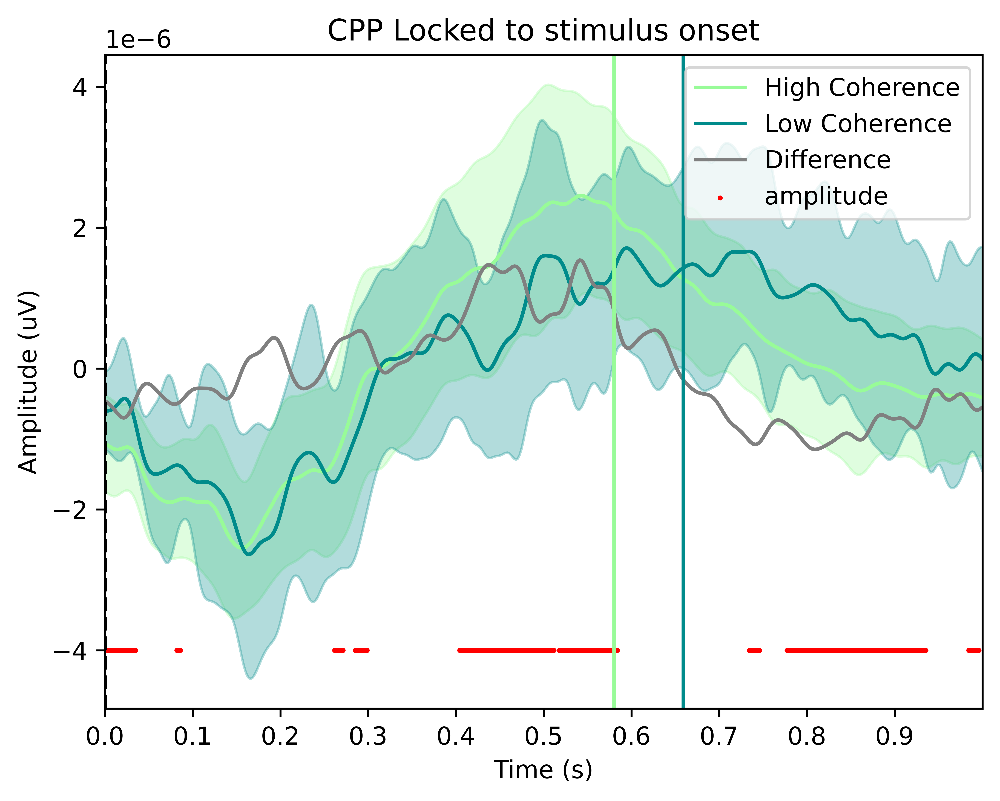

In [35]:
# transform points to time 
x =np.arange(dfs_stim.loc[:,0:].shape[1])/512-1.5 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_stim.loc[dfs_stim['correct']==1].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
cond2 = dfs_stim.loc[dfs_stim['correct']==0].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(#figsize=(10,5),
             dpi=1000)
# plot the mean of each condition
plt.plot(x,
         mean1,
         color='PaleGreen',
         label='Correct')
plt.plot(x,
         mean2,
         color='DarkCyan',
         label='Incorrect')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot the std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
rt_hc = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
rt_lc = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
plt.axvline(x=0, color='black', linestyle='--')
plt.axvline(x=rt_hc.mean(), color='PaleGreen', linestyle='-')
plt.axvline(x=rt_lc.mean(), color='DarkCyan', linestyle='-')

# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
#ts_slp = np.array(sigtest(cond1,cond2,'slope'))
#ts_pk = np.array(sigtest(cond1,cond2,'peak'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 4e-6
#y_slp = np.array(ts_slp) * 0 - 3.8e-6
#y_pk = np.array(ts_pk) * 0 - 1.6e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-1.5,
            y=y_amp,
            color='red', 
            s=1, 
            label='amplitude')
#plt.scatter(x=ts_pk/512-3,
#            y=y_pk,
#            color='gray', 
#            s=1, 
#            label='peak')
# set title and labels
plt.title('CPP Locked to stimulus onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(0,1)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png', dpi=1000)
plt.show()